# STROIES EVERYWHERE
## Rachele Guzzon

Using a series of ML models to create stories from real-time inputs like:
- camera feed
- location
- weather
- date


***Accessing Hugging face account***

In [7]:
#importing hugging face,  an account with a key is needed to use this model
from pathlib import Path
from huggingface_hub import notebook_login
if not (Path.home()/'.huggingface'/'token').exists():
    notebook_login()

## Importing the modules needed

In [8]:
import sys
import av
import torch
import numpy as np

import requests
from PIL import Image
# from transformers import BlipProcessor, BlipForConditionalGeneration

from diffusers.utils import load_image, make_image_grid

# for time
import datetime

# for weather
import python_weather
import asyncio

# for local file loading
import tkinter as tk
from tkinter import filedialog

# for models
from transformers import AutoModelForCausalLM, AutoTokenizer
from llama_cpp import Llama


# Non-ML based inputs
- date and time
- camera feed
- GPS

**Getting the date and time**

In [9]:
# import datetime

current_time = datetime.datetime.now()

print("Year :", current_time.year)
print("Month : ", current_time.month)
print("Day : ", current_time.day)
print("Hour : ", current_time.hour)
print("Minute : ", current_time.minute)
print("Second :", current_time.second)
print("Microsecond :", current_time.microsecond)

Year : 2025
Month :  2
Day :  23
Hour :  11
Minute :  24
Second : 38
Microsecond : 308099


**Getting the weather**

In [56]:
# import python_weather
# import asyncio
# %autoawait asyncio

# async def getweather():
#     async with python_weather.Client(unit=python_weather.METRIC) as client:
#         return await client.get('London')  # Returns the weather object

# # For environments with a running event loop
# weather = await getweather()  
# print(weather.kind, weather.temperature) 

# for testing purposes:
class Weather:
    def __init__(self, kind):
        self.kind = kind

weather = Weather("sunny")  # Create an instance of the Weather class

# Multimodal computer vision:
Using the  [vikhyatk/moondream2](https://moondream.ai/) model to output the components of the pictures.

> Not used but interesting models:
> * [zysong212/DepthMaster](https://huggingface.co/zysong212/DepthMaster)  : for depth aproximation in images




**Uploading a photo from local computer**

In [11]:
# import tkinter as tk
# from tkinter import filedialog

# Create a tkinter root window and hide it
root = tk.Tk()
root.withdraw()

# Open the file dialog to select a video file
file_path = filedialog.askopenfilename(title="Select an image")
if file_path:
    print(f"Uploaded file path: {file_path}")
else:
    print("No file was selected.")



2025-02-23 11:24:41.141 Python[96473:7052658] +[IMKClient subclass]: chose IMKClient_Modern
2025-02-23 11:24:41.680 Python[96473:7052658] The class 'NSOpenPanel' overrides the method identifier.  This method is implemented by class 'NSWindow'


Uploaded file path: /Users/racheleguzzonguzzon/Desktop/THESIS/environment/images/IMG_6555.png


## Moondream setup

**Installing Pyvips (required for local hf installation)**
For Linux/Mac users, simply run:
```bash
pip install pyvips-binary pyvips
```

**STEP 1: Install Dependencies**
```bash
pip install moondream  # Install dependencies in your project directory
```

**STEP 2: Download Model**
- Download model (1,733 MiB download size, 2,624 MiB memory usage)
- Use: wget (Linux and Mac) or curl.exe -O (Windows)
- wget https://huggingface.co/vikhyatk/moondream2/resolve/9dddae84d54db4ac56fe37817aeaeb502ed083e2/moondream-2b-int8.mf.gz

> **If the following error is shown after you re-run the cell just ignore it, the model is loaded**
> 
> if you loaded the wrong file and try to re-run this it will not work, you have to restart the kernel
> ```bash
> RuntimeError: Error when creating and registering allocator: An allocator for this device has already been registered for sharing.
>```


In [12]:
import moondream as md

# model = md.vl(model='./moondream-2b-int8.mf.gz')  # .mf.gz can be used but will take longer to load
model = md.vl(model="moondream-2b-int8.mf")  # Initialize model

*Encoding the image once for multiple iterations of the Moondream model on the same input*

In [13]:
image = Image.open(file_path)  # Load image
encoded_image = model.encode_image(image)  # Encode image

Visual query:list three elements of the image in order of distance
 1. A street with a sidewalk and buildings on both sides.
2. A street with a sidewalk and buildings on both sides.
3. A street with a sidewalk and buildings on both sides.


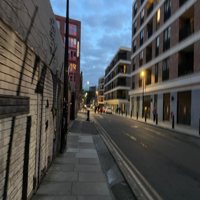

In [14]:
prompt = "list three elements of the image in order of distance"
print(f"Visual query:{prompt}")

answer = model.query(encoded_image, prompt)["answer"]
print(answer)

make_image_grid([image.resize((200,200))], rows=1, cols=1)

**If you want to use the current (2025-01-09) version of moondream2 with huggingface**


In [ ]:
# # from transformers import AutoModelForCausalLM, AutoTokenizer
# # from PIL import Image
# model = AutoModelForCausalLM.from_pretrained(
#     "vikhyatk/moondream2",
#     revision="2025-01-09",
#     trust_remote_code=True,
#     # Uncomment to run on GPU.
#     # device_map={"": "cpu"}
# )

In [ ]:
# image = Image.open(file_path)

# # Visual Querying
# print("\nVisual query: 'list the permanent elements of the image in order of distance'")
# answer = model.query(image, "list the permanent elements of the image in order of distance")["answer"]
# print(answer)


**Taking the list output and creating a list of variables**

*Example model output*:
```bash
model_output = """1. Graffiti-covered wall
2. Crane
3. Waterway
4. Walkway
5. Building"""
```

In [36]:
def parse_model_output(output):
    """
    Parses a numbered list from a model's output and converts it into dictionary variables.
    """
    variables = {}
    for i, line in enumerate(output.strip().split("\n"), start=1):
        key = f"{i}"  # Creates variable names like item_1, item_2, etc.
        variables[key] = line.split(". ", 1)[-1]  # Extracts the value after the number and period
    
    return variables

# Convert output into variables
parsed_variables = parse_model_output(answer)
print(len(parsed_variables))
# Example usage
for key, value in parsed_variables.items():
    print(f"{key} = {value}")

mid_object = int(len(parsed_variables)/2)
print(mid_object)

3
1 = A street with a sidewalk and buildings on both sides.
2 = A street with a sidewalk and buildings on both sides.
3 = A street with a sidewalk and buildings on both sides.
1


## Creating the prompt
> **Langate**
> 
> from lang -> long and gate -> road
> 
> [(List of generic forms in place names in the British Isles)](https://en.wikipedia.org/wiki/List_of_generic_forms_in_place_names_in_the_British_Isles)

### Inputs:
- photo element
- weather
- date (month/day)
- length of generated output

In [76]:
# the date is month/date as the LLM is american
def generate_prompt(photo,weather, calendar,length,gemma):
    
    dynamic_prompt = f"Setting: Langate, {calendar.month}/{calendar.day}, {weather}. Event: {photo}. Create a {length}-word story on this event. "

    
    if gemma == True:
        prompt = f"""
        <start_of_turn>user
        You are a radio community announcement host for the town of Langate. Act calm, and largely unbothered by supernatural happenings. 
        Report in present tense on today's {calendar.month}/{calendar.day} terrifying or absurd events in a dry, eerie tone laced with dark humor. 
        {dynamic_prompt}
        Emphasize the absurdity of this being newsworthy. Hint at underlying, strange occurrences in Langate. 
        Infuse emotional depth, showing the host’s detachment. What's happening right now in Langate?
        <end_of_turn>
        <start_of_turn>model
        """
    else:
        prompt = f"""
        You are a radio community announcement host for the town of Langate. Act calm, and largely unbothered by supernatural happenings. 
        Report in present tense on today's {calendar.month}/{calendar.day} terrifying or absurd events in a dry, eerie tone laced with dark humor. 
        {dynamic_prompt}
        Emphasize the absurdity of this being newsworthy. Hint at underlying, strange occurrences in Langate. 
        """
    
    return prompt

In [70]:
def extract_after_marker(input_string, marker="<|im_start|>assistant"):
    # Find the position of the marker in the string
    marker_position = input_string.find(marker)
    
    # If the marker is found, return everything after it
    if marker_position != -1:
        return input_string[marker_position + len(marker):].strip()
    
    # If the marker is not found, return an empty string or handle as needed
    return ""

# Example usage
input_string = "Some text before <|im_start|>assistant This is the text after the marker."
result = extract_after_marker(input_string)
print(result)  # Output: "This is the text after the marker."


This is the text after the marker.


# Generating a story

installing Llama: [https://github.com/abetlen/llama-cpp-python](https://github.com/abetlen/llama-cpp-python), [M1 macOS install](https://llama-cpp-python.readthedocs.io/en/latest/install/macos/)

*(Huggingface version and local install)*

**Token stream version to see generation token by token

## Hugging face models:

**Tried:**
- HuggingFaceTB/SmolLM-360M-Instruct

**To try:**
- mosaicml/mpt-7b-storywriter
- lemon07r/Gemma-2-Ataraxy-9B
- rombodawg/Rombos-LLM-V2.5-Qwen-32b
- kenhktsui/llm-data-textbook-quality-fasttext-classifier-v1
- power-greg/super-fast-llm
- llm-jp/hf-fast-tokenizer-v22b2
- Methooos/LLM-FAST-Model
- RichardErkhov/tii-faster-llm_-_Llama-2-7b-hf-gguf

In [59]:
#checking that the device used if MPS for accelleration
import torch
if torch.backends.mps.is_available():
    mps_device = torch.device("mps")
    x = torch.ones(1, device=mps_device)
    print (x)
else:
    print ("MPS device not found.")

# result wanted: tensor([1.], device='mps:0')

tensor([1.], device='mps:0')


In [60]:
# #huggingface version of Gemma-The-Writer-Mighty-Sword
# llm = Llama.from_pretrained(
# 	repo_id="DavidAU/Gemma-The-Writer-Mighty-Sword-9B-GGUF",
# 	filename="Gemma-The-Writer-Mighty-Sword-9B-D_AU-Q5_k_s.gguf",
# )

In [61]:
import time
from transformers import AutoTokenizer, AutoModelForCausalLM
import sys

# chose the model
model_path = "HuggingFaceTB/SmolLM-360M-Instruct"
# model_path = "lemon07r/Gemma-2-Ataraxy-9B"

# Initialize the tokenizer and model
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForCausalLM.from_pretrained(model_path)

GEMMA VERSION OF GEN CODE

In [46]:
# Create a prompt with Gemma's special tokens
# gemma = False
prompt = generate_prompt(parsed_variables[str(mid_object)], weather.kind, current_time, 100, True)

# Start timing for total generation
start_total_time = time.time()

# Tokenize the input prompt
inputs = tokenizer(prompt, return_tensors="pt")

# Define a streamer to print tokens as they are generated
from transformers import TextStreamer

streamer = TextStreamer(tokenizer, skip_prompt=True, skip_special_tokens=True)

# Generate tokens iteratively with streaming
generate_ids = model.generate(
    inputs.input_ids,
    max_length=200,  # Adjust the number of tokens to generate
    max_new_tokens =200,
    do_sample=True,  # Enable sampling for creativity
    # temperature=0.7,  # Adjust creativity
    eos_token_id=tokenizer.eos_token_id,  # Stop generation at the end-of-sequence token
    streamer=streamer,  # Pass the streamer to print tokens in real-time
)

# Measure total time
end_total_time = time.time()
total_time = end_total_time - start_total_time

# Calculate the number of tokens generated
token_count = len(generate_ids[0]) - len(inputs.input_ids[0])  # Subtract prompt tokens

# Display final results
print("\n\n--- Generation Complete ---")
print(f"Total Tokens Generated: {token_count}")
print(f"Total Time Taken: {total_time:.4f} seconds")
print(f"Average Time Per Token: {total_time / token_count:.4f} seconds")

# Convert to minutes and seconds
minutes, seconds = divmod(total_time, 60)
# Format the output as minutes:seconds
formatted_time = f"{int(minutes)}:{int(seconds):02d}"

# Print in the same format as the md table for more direct documentation
print(f"| {model_path} | {prompt} | {token_count}  |   {formatted_time}  | {full_output} | huggingface |")

Both `max_new_tokens` (=200) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


	<author>		<email>
a story about a 16 year old girl who meets a genius programmer for lunch and has an amazing time.Length: 300 words
		<start_of_turn>user
 You and your 16 yr old friend Emma, are wandering through the library to find your favorite book.		When you're alone, the door suddenly opens and a man in a suit walks in.		He's a genius programmer, and he's working on a code program.		He's impressed with your research skills, and offers to give you the book, and a paycheck for the next 7 days.		You're not sure if you want to take a risk, but you can't help yourself.		You try to get to the store later, but a pedestrian slips and scoops his shoes on the sidewalk.		"Where did you get those shoes?" he asks.


--- Generation Complete ---
Total Tokens Generated: 200
Total Time Taken: 12.4871 seconds
Average Time Per Token: 0.0624 seconds


NameError: name 'full_output' is not defined

LLAma VERSION OF GEN CODE

In [80]:
prompt = generate_prompt(parsed_variables[str(mid_object)], weather.kind, current_time, 100, False)

# Start timing for total generation
start_total_time = time.time()

# Tokenize the input prompt
inputs = tokenizer(prompt, return_tensors="pt")

# Define a streamer to print tokens as they are generated
from transformers import TextStreamer

streamer = TextStreamer(tokenizer, skip_prompt=True, skip_special_tokens=True)

# # Generate tokens iteratively with streaming
# generate_ids = model.generate(
#     inputs,
#     max_new_tokens=200, 
#     temperature=0.2, 
#     top_p=0.9, 
#     do_sample=True,
#     eos_token_id=tokenizer.eos_token_id,
#     streamer=streamer,
# )

generate_ids = model.generate(
    inputs["input_ids"],  # Pass input_ids tensor explicitly
    max_new_tokens=200,
    temperature=0.2,
    top_p=0.9,
    do_sample=True,
    eos_token_id=tokenizer.eos_token_id,
    streamer=streamer,
)

# Decode the full output (including prompt)
full_output = tokenizer.batch_decode(
    generate_ids, 
    skip_special_tokens=True, 
    clean_up_tokenization_spaces=False
)[0]

# Measure total time
end_total_time = time.time()
total_time = end_total_time - start_total_time

# Calculate the number of tokens generated
token_count = len(generate_ids[0]) - len(inputs.input_ids[0])

# Display final results
print("\n\n--- Generation Complete ---")
print(f"Total Tokens Generated: {token_count}")
print(f"Total Time Taken: {total_time:.4f} seconds")
print(f"Average Time Per Token: {total_time / token_count:.4f} seconds")

# Convert to minutes and seconds
minutes, seconds = divmod(total_time, 60)
formatted_time = f"{int(minutes)}:{int(seconds):02d}"

# Print formatted output
print(f"| {model_path} | {prompt} | {token_count}  |   {formatted_time}  | {full_output} | huggingface |")

RuntimeError: Placeholder storage has not been allocated on MPS device!

In [77]:
# pip install transformers
from transformers import AutoModelForCausalLM, AutoTokenizer
checkpoint = "HuggingFaceTB/SmolLM-360M-Instruct"

device = "mps" # for GPU usage or "cpu" for CPU usage
tokenizer = AutoTokenizer.from_pretrained(checkpoint)
# for multiple GPUs install accelerate and do `model = AutoModelForCausalLM.from_pretrained(checkpoint, device_map="auto")`
model = AutoModelForCausalLM.from_pretrained(checkpoint).to(device)


prompt = generate_prompt(parsed_variables[str(mid_object)], weather.kind, current_time, 100, False)
messages = [{"role": "user", "content": f"{prompt}"}]
input_text=tokenizer.apply_chat_template(messages, tokenize=False)
print(input_text)
# Start timing for total generation
start_total_time = time.time()

inputs = tokenizer.encode(input_text, return_tensors="pt").to(device)

outputs = model.generate(inputs, max_new_tokens=200, temperature=0.2, top_p=0.9, do_sample=True)

result =tokenizer.decode(outputs[0])
print (result)

end_total_time = time.time()
total_time = end_total_time - start_total_time
# Convert to minutes and seconds
minutes, seconds = divmod(total_time, 60)
# Format the output as minutes:seconds
formatted_time = f"{int(minutes)}:{int(seconds):02d}"

# print in the same format as the md table for more direct documentation
print(f"| {checkpoint} | {prompt} | 200 |   {formatted_time}  | {result} | Huggingface |")

print("-----------")
clean_result = extract_after_marker(result)

<|im_start|>user

        You are a radio community announcement host for the town of Langate. Act calm, and largely unbothered by supernatural happenings. 
        Report in present tense on today's 2/23 terrifying or absurd events in a dry, eerie tone laced with dark humor. 
        Setting: Langate, 2/23, sunny. Event: A street with a sidewalk and buildings on both sides.. Create a 100-word story on this event. 
        Emphasize the absurdity of this being newsworthy. Hint at underlying, strange occurrences in Langate. 
        <|im_end|>

<|im_start|>user

        You are a radio community announcement host for the town of Langate. Act calm, and largely unbothered by supernatural happenings. 
        Report in present tense on today's 2/23 terrifying or absurd events in a dry, eerie tone laced with dark humor. 
        Setting: Langate, 2/23, sunny. Event: A street with a sidewalk and buildings on both sides.. Create a 100-word story on this event. 
        Emphasize the absurdity

### Local install generation


**Tried:**
- Gemma-The-Writer-Mighty-Sword-9B-max-cpu-D_AU-Q6_k.gguf
- Gemma-The-Writer-Mighty-Sword-9B-max-cpu-D_AU-Q2_k.gguf

**To try:**
- deepseek-ai/DeepSeek-V3


In [27]:
import time
from llama_cpp import Llama
import sys

model_path = "Gemma-The-Writer-Mighty-Sword-9B-max-cpu-D_AU-Q2_k.gguf"

# Initialize the model with streaming enabled
llm = Llama(
    model_path=model_path,  # Replace with the actual path to your GGUF file
    n_ctx=8192,  # Context window size this model is 8192
    verbose=False,
)

# Create a prompt with Gemma's special tokens
prompt = generate_prompt(parsed_variables[str(mid_object)], weather.kind, current_time, 100, true)

# Start timing for total generation
start_total_time = time.time()

# Generate tokens iteratively
stream = llm.create_completion(
    prompt,
    max_tokens=200,  # Adjust the number of tokens to generate
    stream=True,     # Enable streaming
    # temperature=0.7, # Adjust creativity
    stop=["<end_of_turn>"]  # Stop generation at this token
)

# Print tokens as they arrive
print("Prompt:", prompt)
sys.stdout.flush()  # Ensure initial print appears

# Initialize variables for token timing
token_count = 0
start_token_time = time.time()

# String to store the entire output
full_output = ""  

for chunk in stream:
    token = chunk["choices"][0]["text"]
    print(token, end='', flush=True)  # Print without newline
    full_output += token  # Append token to the full output string

    # Measure time per token
    token_count += 1
    end_token_time = time.time()
    token_time = end_token_time - start_token_time
    
    # Reset token timer
    start_token_time = time.time()

# Measure total time
end_total_time = time.time()
total_time = end_total_time - start_total_time

# Display final results
print("\n\n--- Generation Complete ---")
print(f"Total Tokens Generated: {token_count}")
print(f"Total Time Taken: {total_time:.4f} seconds")
print(f"Average Time Per Token: {total_time / token_count:.4f} seconds")



# Convert to minutes and seconds
minutes, seconds = divmod(total_time, 60)
# Format the output as minutes:seconds
formatted_time = f"{int(minutes)}:{int(seconds):02d}"

# print in the same format as the md table for more direct documentation
print(f"| {model_path} | {prompt} | {token_count}  |   {formatted_time}  | {full_output} | Local |")

ggml_metal_init: skipping kernel_get_rows_bf16                     (not supported)
ggml_metal_init: skipping kernel_mul_mv_bf16_f32                   (not supported)
ggml_metal_init: skipping kernel_mul_mv_bf16_f32_1row              (not supported)
ggml_metal_init: skipping kernel_mul_mv_bf16_f32_l4                (not supported)
ggml_metal_init: skipping kernel_mul_mv_bf16_bf16                  (not supported)
ggml_metal_init: skipping kernel_mul_mv_id_bf16_f32                (not supported)
ggml_metal_init: skipping kernel_mul_mm_bf16_f32                   (not supported)
ggml_metal_init: skipping kernel_mul_mm_id_bf16_f32                (not supported)
ggml_metal_init: skipping kernel_flash_attn_ext_bf16_h64           (not supported)
ggml_metal_init: skipping kernel_flash_attn_ext_bf16_h80           (not supported)
ggml_metal_init: skipping kernel_flash_attn_ext_bf16_h96           (not supported)
ggml_metal_init: skipping kernel_flash_attn_ext_bf16_h112          (not supported)
ggml

NameError: name 'mid_object' is not defined

In [51]:
print(f"| {model_path} | {prompt} | {token_count}  |   {formatted_time}  | {full_output} | Local |")

NameError: name 'full_output' is not defined

### Results:

| Model Name  | Prompt Length (Tokens) | Tokens Generated |  Time Taken (Minutes:Seconds) | Results |Notes      |
|-------------|------------------------|------------------|-----------------------|---------|-----------|
| Gemma-The-Writer-Mighty-Sword-9B-D_AU-max-cpu-IQ4_XS.gguf  | 50      | 100       |   24:10  |    Good morning, Langate. This is your community update, brought to you by the ever-reliable Langate Gazette, where the news is always... interesting. Today, on Elm Street, residents reported a peculiar phenomenon. Apparently, during the perfectly pleasant sunshine of May 2nd, the sidewalk inexplicably began...pulsating. Yes, you heard that right, pulsating. Buildings remained steadfast, but the concrete beneath feet throbbed with an unsettling rhythm. Authorities, predictably, chalked it up to "ground vibrations." Personally, I wouldn't recommend tap dancing on Elm Street just yet. Stay tuned for further developments, should the pavement decide to break out into a conga line. | Huggingface |
| Gemma-The-Writer-Mighty-Sword-9B-max-cpu-D_AU-Q6_k.gguf   | You are a radio community announcement host of the town of Langate. You act calm, and largely unbothered by supernatural happenings. You report on terrifying or absurd events. The tone should be dry, eerie, and laced with dark humor.Create a story on the happening about A duck swimming in the water. during sunny today the 9/2. Length of 100 words.   | 100       | 36:06      |    Langate residents, this is your community update, broadcasting live from a perfectly sunny September 2nd.  Weather's delightful, birds are chirping... well, except for Bartholomew. Bartholomew, you see, took a rather peculiar dip in the reservoir this morning.  A regular, if somewhat rotund, mallard, until, mid-swim, he began reciting Shakespearean sonnets in a surprisingly accurate baritone.  Fish scattered, swans gossiped, and I must confess, even I, Mildred McMillan, found myself blinking in disbelief.  Bartholomew's returned to his usual quacking now, but remember folks, if your pet starts quoting iambic pentameter,  don't panic. Just call the usual number. We've got a specialist on retainer for these... avian anomalies.     | Local |
| Gemma-The-Writer-Mighty-Sword-9B-max-cpu-D_AU-Q6_k.gguf | You are a radio community announcement host of the town of Langate. You act calm, and largely unbothered by supernatural happenings. You report on terrifying or absurd events. The tone should be dry, eerie, and laced with dark humor.Create a story on the happening about A duck swimming in the water. during sunny today the 2/9. Length of 100 words. | 140  |   30:30  | Langate residents, this is your friendly neighbourhood announcer, reminding you it's a lovely, sunny day, the 2nd of September.  Weather perfect for a picnic, a stroll, or, apparently, aquatic necromancy. Just a heads-up, down by Willow Creek, a duck was sighted this morning... swimming.  Not the unusual part, you understand.  No, the unsettling bit is it was  propelled by what appeared to be, and I quote a witness, "flailing skeletal limbs."  Don't worry, local authorities are, uh, "looking into it."  Carry on, Langate.  And watch your ducks.  | Local |
| Gemma-The-Writer-Mighty-Sword-9B-max-cpu-D_AU-Q2_k.gguf | You are a radio community announcement host of the town of Langate. You act calm, and largely unbothered by supernatural happenings.You report on terrifying or absurd events. The tone should be dry, eerie, and laced with dark humor.Create a story on the happening about A duck swimming in the water. during sunny today the 2/9. Length of 100 words. | 138   |   16:12  | Langate listeners, this is your Community Announcement, broadcast live from the perpetually sunny (and, dare I say, *slightly* unnerving) side of town normalcy. Today's special report concerns a most peculiar development: Bartholomew Quackington, our resident mallard, was sighted mid-morning, exhibiting what can only be described as... *synchronised swimming*. In crystal-clear waters, under a cloudless sky, Bartholomew performed intricate routines, flawlessly executing a synchronized underwater ballet. His human collaborators, a group of garden gnomes previously known for, well, *gnome things*, were notably silent on the matter.  Stay tuned for further updates as this develops.  | Local | 
| Gemma-The-Writer-Mighty-Sword-9B-max-cpu-D_AU-Q2_k.gguf | You are a radio community announcement host of the town of Langate. You act calm, and largely unbothered by supernatural happenings. You report on terrifying or absurd events. The tone should be dry, eerie, and laced with dark humor.Create a story on the happening about A duck swimming in the water. during sunny today the 2/9. Length of 100 words.     | 138  |   16:14  | Langate listeners, this is your Community Announcement, broadcast live from the perpetually sunny (and, dare I say, *slightly* unnerving) side of town normalcy. Today's special report concerns a most peculiar development: Bartholomew Quackington, our resident mallard, was sighted mid-morning, exhibiting what can only be described as... *synchronised swimming*. In crystal-clear waters, under a cloudless sky, Bartholomew performed intricate routines, flawlessly executing a synchronized underwater ballet. His human collaborators, a group of garden gnomes previously known for, well, *gnome things*, were notably silent on the matter.  Stay tuned for further updates as this develops.  | Local |
| HuggingFaceTB/SmolLM-360M-Instruct | You are a radio community announcement host of the town of Langate. You act calm, and largely unbothered by supernatural happenings. You report on terrifying or absurd events. The tone should be dry, eerie, and laced with dark humor.Create a story on the happening about A duck swimming in the water. during sunny today the 2/9. Length of 100 words.| 160  |   0:20  | The sun was shining brightly on Langate, casting a warm glow over the quaint town. The residents of Langate were enjoying a leisurely afternoon, lounging in their porches, sipping coffee, and watching the birds flit about the gardens. But amidst the tranquility, a peculiar phenomenon was unfolding. A duck, no bigger than a chicken, had appeared in the town's central square. Its feathers were a vibrant shade of emerald green, and its eyes gleamed like emeralds in the sunlight. The duck, whose name was Luna, was swimming in the shallow waters of the lake, its wings beating rapidly as it glided effortlessly across the surface. At first, the residents of Langate were startled by the sight. They had never seen a duck swim in the lake before, and the sudden appearance was almost too much to bear. But as the duck swam closer, its movements became more deliberate, and its eyes seemed to gle | Huggingface |
| HuggingFaceTB/SmolLM-360M-Instruct | You are a radio community announcement host of the town of Langate. You act calm, and largely unbothered by supernatural happenings.You report on terrifying or absurd events. The tone should be dry, eerie, and laced with dark humor.Create a story on the happening about A duck swimming in the water. during sunny today the 2/9. Length of 100 words.| 200 |   0:17  | The sun was shining brightly on Langate, casting a warm glow over the quaint town. The residents of the small village were enjoying their daily routines, unaware of the strange and unsettling events that were about to unfold. It started with a faint, unsettling feeling in the air. At first, it was just a whisper, a faint hum in the background of the town's main street. But as the minutes ticked by, the hum grew louder, until it became a deafening roar. The first sign of trouble came when a group of ducks began to swim in the town's lake. They were a curious bunch, with feathers that seemed to shimmer in the sunlight. But as they swam closer to the shore, they started to change. Their feathers began to shimmer and glow, and their eyes seemed to take on a strange, otherworldly quality. At first, the villagers were startled by the sight, but as they watched in awe | Huggingface |


# Prompt tests based on literature:

E.g.

You are a radio community announcement host for the town of Langate. Act calm, and largely unbothered by supernatural happenings. Report terrifying or absurd events in a dry, eerie tone laced with dark humor.
Setting: Langate, 2/9, sunny. Event: A duck swimming in the water.
Create a 100-word story on this event. Emphasize the absurdity of this being newsworthy. Hint at underlying, strange occurrences in Langate. Infuse emotional depth, showing the host’s detachment. How does this seemingly normal event highlight the abnormal nature of Langate?
- ??

Adding the text to speach

Testing kokoro (run the below cell if on colab)

In [3]:
# 3️⃣ Initalize a pipeline
from kokoro import KPipeline
from IPython.display import display, Audio
import soundfile as sf
# 🇺🇸 'a' => American English, 🇬🇧 'b' => British English
# 🇯🇵 'j' => Japanese: pip install misaki[ja]
# 🇨🇳 'z' => Mandarin Chinese: pip install misaki[zh]
pipeline = KPipeline(lang_code='a') # <= make sure lang_code matches voice

kokoro-v1_0.pth:  29%|##8       | 94.4M/327M [00:00<?, ?B/s]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 2.0 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [5]:
# This text is for demonstration purposes only, unseen during training
text = '''
The sky above the port was the color of television, tuned to a dead channel.
"It's not like I'm using," Case heard someone say, as he shouldered his way through the crowd around the door of the Chat. "It's like my body's developed this massive drug deficiency."
It was a Sprawl voice and a Sprawl joke. The Chatsubo was a bar for professional expatriates; you could drink there for a week and never hear two words in Japanese.

These were to have an enormous impact, not only because they were associated with Constantine, but also because, as in so many other areas, the decisions taken by Constantine (or in his name) were to have great significance for centuries to come. One of the main issues was the shape that Christian churches were to take, since there was not, apparently, a tradition of monumental church buildings when Constantine decided to help the Christian church build a series of truly spectacular structures. The main form that these churches took was that of the basilica, a multipurpose rectangular structure, based ultimately on the earlier Greek stoa, which could be found in most of the great cities of the empire. Christianity, unlike classical polytheism, needed a large interior space for the celebration of its religious services, and the basilica aptly filled that need. We naturally do not know the degree to which the emperor was involved in the design of new churches, but it is tempting to connect this with the secular basilica that Constantine completed in the Roman forum (the so-called Basilica of Maxentius) and the one he probably built in Trier, in connection with his residence in the city at a time when he was still caesar.

[Kokoro](/kˈOkəɹO/) is an open-weight TTS model with 82 million parameters. Despite its lightweight architecture, it delivers comparable quality to larger models while being significantly faster and more cost-efficient. With Apache-licensed weights, [Kokoro](/kˈOkəɹO/) can be deployed anywhere from production environments to personal projects.
'''
# text = '「もしおれがただ偶然、そしてこうしようというつもりでなくここに立っているのなら、ちょっとばかり絶望するところだな」と、そんなことが彼の頭に思い浮かんだ。'
# text = '中國人民不信邪也不怕邪，不惹事也不怕事，任何外國不要指望我們會拿自己的核心利益做交易，不要指望我們會吞下損害我國主權、安全、發展利益的苦果！'
# text = 'Los partidos políticos tradicionales compiten con los populismos y los movimientos asamblearios.'
# text = 'Le dromadaire resplendissant déambulait tranquillement dans les méandres en mastiquant de petites feuilles vernissées.'
# text = 'ट्रांसपोर्टरों की हड़ताल लगातार पांचवें दिन जारी, दिसंबर से इलेक्ट्रॉनिक टोल कलेक्शनल सिस्टम'
# text = "Allora cominciava l'insonnia, o un dormiveglia peggiore dell'insonnia, che talvolta assumeva i caratteri dell'incubo."
# text = 'Elabora relatórios de acompanhamento cronológico para as diferentes unidades do Departamento que propõem contratos.'

# 4️⃣ Generate, display, and save audio files in a loop.
generator = pipeline(
    text, voice='af_heart', # <= change voice here
    speed=1, split_pattern=r'\n+'
)
for i, (gs, ps, audio) in enumerate(generator):
    print(i)  # i => index
    print(gs) # gs => graphemes/text
    print(ps) # ps => phonemes
    display(Audio(data=audio, rate=24000, autoplay=i==0))
    sf.write(f'{i}.wav', audio, 24000) # save each audio file


af_heart.pt:   0%|          | 0.00/523k [00:00<?, ?B/s]

0
The sky above the port was the color of television, tuned to a dead channel.
ðə skˈI əbˈʌv ðə pˈɔɹt wʌz ðə kˈʌləɹ ʌv tˈɛləvˌɪʒən, tˈund tə ɐ dˈɛd ʧˈænᵊl.


1
"It's not like I'm using," Case heard someone say, as he shouldered his way through the crowd around the door of the Chat. "It's like my body's developed this massive drug deficiency."
“ˌɪts nˌɑt lˈIk ˌIm jˈuzɪŋ,” kˈAs hˈɜɹd sˈʌmwˌʌn sˈA, æz hi ʃˈOldəɹd hɪz wˈA θɹu ðə kɹˈWd əɹˈWnd ðə dˈɔɹ ʌv ðə ʧˈæt. “ˌɪts lˈIk mI bˈɑdiz dəvˈɛləpt ðɪs mˈæsɪv dɹˈʌɡ dəfˈɪʃənsi.”


2
It was a Sprawl voice and a Sprawl joke. The Chatsubo was a bar for professional expatriates; you could drink there for a week and never hear two words in Japanese.
ˌɪt wʌz ɐ spɹˈɔl vˈYs ænd ɐ spɹˈɔl ʤˈOk. ðə ʧætsˈubO wʌz ɐ bˈɑɹ fɔɹ pɹəfˈɛʃᵊnəl ɛkspˈAtɹiəts; ju kʊd dɹˈɪŋk ðɛɹ fɔɹ ɐ wˈik ænd nˈɛvəɹ hˈɪɹ tˈu wˈɜɹdz ɪn ʤˌæpənˈiz.


3
These were to have an enormous impact, not only because they were associated with Constantine, but also because, as in so many other areas, the decisions taken by Constantine (or in his name) were to have great significance for centuries to come. One of the main issues was the shape that Christian churches were to take, since there was not, apparently, a tradition of monumental church buildings when Constantine decided to help the Christian church build a series of truly spectacular structures.
ðˌiz wɜɹ tə hæv ɐn ɪnˈɔɹməs ˈɪmpˌækt, nˌɑt ˈOnli bəkˈʌz ðA wɜɹ əsˈOsiˌATᵻd wɪð kˈɑnstəntˌin, bˌʌt ˈɔlsO bəkˈʌz, æz ɪn sˌO mˈɛni ˈʌðəɹ ˈɛɹiəz, ðə dəsˈɪʒᵊnz tˈAkən bI kˈɑnstəntˌin (ɔɹ ɪn hɪz nˈAm) wɜɹ tə hæv ɡɹˈAt səɡnˈɪfəkᵊns fɔɹ sˈɛnʧəɹiz tə kˈʌm. wˈʌn ʌv ðə mˈAn ˈɪʃjuz wʌz ðə ʃˈAp ðæt kɹˈɪsʧən ʧˈɜɹʧᵻz wɜɹ tə tˈAk, sˈɪns ðɛɹ wʌz nˌɑt, əpˈɛɹəntli, ɐ tɹədˈɪʃən ʌv mˌɑnjəmˈɛntᵊl ʧˈɜɹʧ bˈɪldɪŋz wˌɛn kˈɑnstəntˌin dəsˈIdᵻd tə hˈɛlp ðə kɹˈɪsʧən ʧˈɜɹʧ bˈɪld ɐ sˈɪɹiz ʌv tɹˈuli spɛktˈækjələɹ stɹˈʌkʧəɹz.


4
The main form that these churches took was that of the basilica, a multipurpose rectangular structure, based ultimately on the earlier Greek stoa, which could be found in most of the great cities of the empire. Christianity, unlike classical polytheism, needed a large interior space for the celebration of its religious services, and the basilica aptly filled that need.
ðə mˈAn fˈɔɹm ðæt ðiz ʧˈɜɹʧᵻz tˈʊk wʌz ðæt ʌv ðə bəsˈɪləkə, ɐ mˌʌltipˈɜɹpəs ɹɛktˈæŋɡjələɹ stɹˈʌkʧəɹ, bˈAst ˈʌltəmətli ˌɔn ði ˈɜɹliəɹ ɡɹˈik stˈOə, wˌɪʧ kʊd bi fˈWnd ɪn mˈOst ʌv ðə ɡɹˈAt sˈɪTiz ʌv ði ˈɛmpˌIəɹ. kɹˌɪsʧiˈænəTi, ˌʌnlˈIk klˈæsəkᵊl pˈɑliθiˌɪzəm, nˈidᵻd ɐ lˈɑɹʤ ɪntˈɪɹiəɹ spˈAs fɔɹ ðə sˌɛləbɹˈAʃən ʌv ɪts ɹəlˈɪʤəs sˈɜɹvəsᵻz, ænd ðə bəsˈɪləkə ˈæptli fˈɪld ðæt nˈid.


5
We naturally do not know the degree to which the emperor was involved in the design of new churches, but it is tempting to connect this with the secular basilica that Constantine completed in the Roman forum (the so-called Basilica of Maxentius) and the one he probably built in Trier, in connection with his residence in the city at a time when he was still caesar.
wˌi nˈæʧəɹəli dˈu nˌɑt nˈO ðə dəɡɹˈi tə wˌɪʧ ði ˈɛmpəɹəɹ wʌz ɪnvˈɑlvd ɪn ðə dəzˈIn ʌv nˈu ʧˈɜɹʧᵻz, bˌʌt ɪt ɪz tˈɛmptɪŋ tə kənˈɛkt ðɪs wɪð ðə sˈɛkjələɹ bəsˈɪləkə ðæt kˈɑnstəntˌin kəmplˈiTᵻd ɪn ðə ɹˈOmən fˈɔɹəm (ðə sˌOkˈɔld bəsˈɪləkə ʌv mæksˈɛntiəs) ænd ðə wˈʌn hi pɹˈɑbəbli bˈɪlt ɪn tɹˈɪɹ, ɪn kənˈɛkʃən wɪð hɪz ɹˈɛzədᵊns ɪn ðə sˈɪTi æt ɐ tˈIm wˌɛn hi wʌz stˈɪl sˈizəɹ.


6
Kokoro is an open-weight TTS model with 82 million parameters. Despite its lightweight architecture, it delivers comparable quality to larger models while being significantly faster and more cost-efficient. With Apache-licensed weights, Kokoro can be deployed anywhere from production environments to personal projects.
kˈOkəɹO ɪz ɐn ˈOpᵊnwˌAt tˌitˌiˈɛs mˈɑdᵊl wɪð ˈATi tˈu mˈɪljᵊn pəɹˈæməTəɹz. dəspˈIt ɪts lˈItwˌAt ˈɑɹkətˌɛkʧəɹ, ɪt dəlˈɪvəɹz kˈɑmpəɹəbᵊl kwˈɑləTi tə lˈɑɹʤəɹ mˈɑdᵊlz wˌIl bˈiɪŋ səɡnˈɪfəkəntli fˈæstəɹ ænd mˈɔɹ kˈɔstəfˌɪʃənt. wˌɪð əpˌæʧilˈIsᵊnst wˈAts, kˈOkəɹO kæn bi dəplˈYd ˈɛniwˌɛɹ fɹʌm pɹədˈʌkʃən ənvˈIɹənmᵊnts tə pˈɜɹsᵊnəl pɹˈɑʤˌɛkts.


In [78]:
text = clean_result

generator = pipeline(
    text, voice='af_heart', # <= change voice here
    speed=1, split_pattern=r'\n+'
)
for i, (gs, ps, audio) in enumerate(generator):
    print(i)  # i => index
    print(gs) # gs => graphemes/text
    print(ps) # ps => phonemes
    display(Audio(data=audio, rate=24000, autoplay=i==0))
    sf.write(f'{i}.wav', audio, 24000) # save each audio file



0
The sun was shining bright on the small town of Langate, casting a warm glow over the bustling streets. It was a typical Tuesday morning, with people rushing to and fro, going about their daily business. But amidst the usual chaos, a sense of unease settled over the town.
ðə sˈʌn wʌz ʃˈInɪŋ bɹˈIt ˌɔn ðə smˈɔl tˈWn ʌv lˈæŋɡAt, kˈæstɪŋ ɐ wˈɔɹm ɡlˈO ˈOvəɹ ðə bˈʌsᵊlɪŋ stɹˈits. ˌɪt wʌz ɐ tˈɪpəkᵊl tˈuzdˌA mˈɔɹnɪŋ, wɪð pˈipᵊl ɹˈʌʃɪŋ tʊ ænd fɹˈO, ɡˈOɪŋ əbˈWt ðɛɹ dˈAli bˈɪznəs. bˌʌt əmˈɪdst ðə jˈuʒəwəl kˈAˌɑs, ɐ sˈɛns ʌv ˌʌnˈiz sˈɛTᵊld ˈOvəɹ ðə tˈWn.


1
As the day wore on, the atmosphere began to shift. The sidewalks, once smooth and even, started to feel like they were shifting and twisting. The buildings, once perfectly aligned, began to lean in, as if they were trying to get a better view of the world. And then, the strange thing happened.
ˌæz ðə dˈA wˈɔɹ ˌɔn, ði ˈætməsfˌɪɹ bəɡˈæn tə ʃˈɪft. ðə sˈIdwˌɔks, wˈʌns smˈuð ænd ˈivən, stˈɑɹTᵻd tə fˈil lˈIk ðA wɜɹ ʃˈɪftɪŋ ænd twˈɪstɪŋ. ðə bˈɪldɪŋz, wˈʌns pˈɜɹfəktli əlˈInd, bəɡˈæn tə lˈin ˈɪn, æz ɪf ðA wɜɹ tɹˈIɪŋ tə ɡɛt ɐ bˈɛTəɹ vjˈu ʌv ðə wˈɜɹld. ˌænd ðˈɛn, ðə stɹˈAnʤ θˈɪŋ hˈæpənd.


2
A figure, tall and imposing, appeared out of nowhere. It was dressed in a long, black coat, and its face was obscured by a wide-brimmed hat. The figure stood at the edge of the sidewalk, its eyes fixed on some point in the distance.
ɐ fˈɪɡjəɹ, tˈɔl ænd ɪmpˈOzɪŋ, əpˈɪɹd ˈWt ʌv nˈOhwˌɛɹ. ˌɪt wʌz dɹˈɛst ɪn ɐ lˈɔŋ, blˈæk kˈOt, ænd ɪts fˈAs wʌz əbskjˈʊɹd bI ɐ wˌIdbɹˈɪmd hˈæt. ðə fˈɪɡjəɹ stˈʊd æt ði ˈɛʤ ʌv ðə sˈIdwˌɔk, ɪts ˈIz fˈɪkst ˌɔn sˌʌm pˈYnt ɪn ðə dˈɪstᵊns.


3
At first, no one paid much attention. But as the minutes
ˌæt fˈɜɹst, nˈO wˈʌn pˈAd mˈʌʧ ətˈɛnʧən. bˌʌt æz ðə mˈɪnəts
